In [261]:
import numpy as np
import pylab
import matplotlib.pyplot as plt
from skimage import transform, filters
import sys, os
import urllib
from scipy.misc import imsave

% matplotlib inline

%load_ext autoreload
%autoreload 2

import caffe

from helpers import *
from heatmaps import *
from optimize_mask import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
gpu = 0
net_type = 'googlenet'

In [5]:
caffe.set_device(gpu)
caffe.set_mode_gpu()

googlenet = get_net(net_type)
net = googlenet

# for each layer, show the output shape
for layer_name, blob in net.blobs.iteritems():
    print layer_name + '\t' + str(blob.data.shape)

data	(1, 3, 224, 224)
conv1/7x7_s2	(10, 64, 112, 112)
pool1/3x3_s2	(10, 64, 56, 56)
pool1/norm1	(10, 64, 56, 56)
conv2/3x3_reduce	(10, 64, 56, 56)
conv2/3x3	(10, 192, 56, 56)
conv2/norm2	(10, 192, 56, 56)
pool2/3x3_s2	(10, 192, 28, 28)
pool2/3x3_s2_pool2/3x3_s2_0_split_0	(10, 192, 28, 28)
pool2/3x3_s2_pool2/3x3_s2_0_split_1	(10, 192, 28, 28)
pool2/3x3_s2_pool2/3x3_s2_0_split_2	(10, 192, 28, 28)
pool2/3x3_s2_pool2/3x3_s2_0_split_3	(10, 192, 28, 28)
inception_3a/1x1	(10, 64, 28, 28)
inception_3a/3x3_reduce	(10, 96, 28, 28)
inception_3a/3x3	(10, 128, 28, 28)
inception_3a/5x5_reduce	(10, 16, 28, 28)
inception_3a/5x5	(10, 32, 28, 28)
inception_3a/pool	(10, 192, 28, 28)
inception_3a/pool_proj	(10, 32, 28, 28)
inception_3a/output	(10, 256, 28, 28)
inception_3a/output_inception_3a/output_0_split_0	(10, 256, 28, 28)
inception_3a/output_inception_3a/output_0_split_1	(10, 256, 28, 28)
inception_3a/output_inception_3a/output_0_split_2	(10, 256, 28, 28)
inception_3a/output_inception_3a/output_0_spl

In [6]:
labels_desc = np.loadtxt('/home/ruthfong/packages/caffe/data/ilsvrc12/synset_words.txt', str, delimiter='\t')
(paths, labels) = read_imdb('/home/ruthfong/packages/caffe/data/ilsvrc12/val_imdb.txt')
paths = np.array(paths)
labels = np.array(labels)
data_desc = 'val'
res_dir = '/data/ruthfong/neural_coding/results_reb/occ_masks_imagenet_googlenet_val_defaults/'
mask_dir = '/data/ruthfong/neural_coding/pycaffe_results/googlenet_train_heldout_given_grad_1_norm_0/min_top0_prob_blur/lr_-1.00_l1_lambda_-4.00_tv_lambda_-inf_l1_lambda_2_-2.00_beta_3.00_mask_scale_8_blur_mask_5_jitter_4_noise_-inf_num_iters_300_tv2_mask_init'
mask_paths = np.array([os.path.join(mask_dir, '%d.npy' % x) for x in range(len(labels))])

In [7]:
transformer = get_ILSVRC_net_transformer(net)

In [37]:
for i in find_labels('panda'):
    print i, get_short_class_name(i)

387 lesser panda
388 giant panda


In [244]:
caffe.io.load_image(paths[2])*255

array([[[  20.,   10.,    0.],
        [  19.,   11.,    0.],
        [  19.,   12.,    2.],
        ..., 
        [  50.,   41.,   24.],
        [  44.,   38.,   22.],
        [  37.,   33.,   21.]],

       [[  21.,   11.,    2.],
        [  21.,   12.,    3.],
        [  23.,   14.,    5.],
        ..., 
        [  59.,   39.,   28.],
        [  55.,   37.,   27.],
        [  49.,   34.,   27.]],

       [[  20.,   11.,    2.],
        [  20.,   11.,    2.],
        [  22.,   12.,    3.],
        ..., 
        [  45.,   33.,   19.],
        [  37.,   27.,   15.],
        [  34.,   26.,   15.]],

       ..., 
       [[  82.,  103.,   98.],
        [  74.,   89.,   86.],
        [  75.,   87.,   85.],
        ..., 
        [  56.,   55.,   61.],
        [  52.,   51.,   57.],
        [  63.,   60.,   67.]],

       [[  97.,  103.,  103.],
        [  94.,   99.,  102.],
        [  89.,   93.,   96.],
        ..., 
        [  54.,   57.,   66.],
        [  51.,   53.,   65.],
        [ 

In [246]:
transformer.deprocess('data', transformer.preprocess('data', caffe.io.load_image(paths[2])))*255

array([[[  19.92863274,   10.95312309,    0.88175905],
        [  21.19643211,   13.2364254 ,    3.57347822],
        [  24.7244091 ,   13.29434776,    4.52485609],
        ..., 
        [  65.88199615,   33.7394371 ,   23.16041565],
        [  55.01580429,   40.61178207,   24.5       ],
        [  45.14949417,   36.00210953,   23.43074799]],

       [[  20.04633904,   11.03517723,    2.03517866],
        [  24.55411339,   12.00946617,    3.84821272],
        [  34.13928604,   14.20445824,    5.02142286],
        ..., 
        [  59.35361862,   37.84823227,   26.7379837 ],
        [  48.85383224,   35.34883499,   22.24169159],
        [  35.5399971 ,   26.47527122,   14.90643215]],

       [[  24.83705711,   16.20759392,    5.83705091],
        [  25.49687004,   12.95223045,    3.84821272],
        [  31.50073814,   17.28495598,    7.54984236],
        ..., 
        [  20.52821922,   16.64357567,    8.88685513],
        [  30.66068077,   22.15443993,   10.365592  ],
        [  36.16904

In [257]:
def compute_adversarial_example(net, transformer, path, label, method = 'fgsm', step = 1, 
                                alpha = 1.0, eps = 16, adv_label = 'min', top = 'prob', show_fig = False):
    assert(method == 'fgsm' or method == 'one_step') # fast gradient sign method or one-step target class
    
    img = transformer.preprocess('data', caffe.io.load_image(path))
    orig_img = transformer.deprocess('data', img)
    
    # forward pass
    net.blobs['data'].data[...] = img
    net.forward(start = 'data', end = top)

    orig_scores = np.squeeze(net.blobs[top].data.copy())
    max_label = np.argmax(orig_scores)
    
    # set target class
    if method == 'fgsm':
        target_label = label 
    elif method == 'one_step':
        if adv_label == 'min':
            target_label = np.argmin(orig_scores)
        elif adv_label == 'rand':
            target_label = np.random.randint(net.blobs[top].data.shape[-1])
        else:
            target_label = adv_label
    else:
        assert(False)
        
    if step is None:
        step = int(np.minimum(eps+4, 1.25*eps))
                
    adv_img = orig_img.copy()
    for i in range(step):
        if i > 0:
            # forward pass
            net.blobs['data'].data[...] = transformer.preprocess('data', adv_img)
            net.forward(start = 'data', end = top)

        # compute derivative of cross-entropy loss (w.r.t softmax)
        curr_scores = np.squeeze(net.blobs[top].data.copy())
        top_grad = np.zeros(net.blobs[top].data.shape) # (1,1000)
        top_grad[0][target_label] = -1/float(curr_scores[target_label]) 

        # backward pass
        net.blobs[top].diff[...] = top_grad
        net.backward(start = top, end = 'data')

        # construct adversarial example using bottom gradient
        bottom_grad = net.blobs['data'].diff.copy()
        if method == 'fgsm':
            adv_img += alpha/float(255)*np.transpose(np.squeeze(np.sign(bottom_grad)), (1,2,0))
        else:
            adv_img -= alpha/float(255)*np.transpose(np.squeeze(np.sign(bottom_grad)), (1,2,0))
        
        # clip if not one-step method
        if step != 1:
            adv_img[...] = np.clip(np.clip(adv_img, orig_img - eps/float(255), 
                                   orig_img + eps/float(255)),0,1)

    if show_fig:
        # forward pass with adversarial example
        net.blobs[bottom].data[...] = transformer.preprocess('data', adv_img)
        net.forward(end = top)
        adv_scores = np.squeeze(net.blobs[top].data.copy())
        adv_label = np.argmax(adv_scores)

        f, ax = plt.subplots(1,3)
        f.set_size_inches(12, 6)
        ax[0].imshow(orig_img)
        ax[0].set_title('%s: %.2f (%s: %.2f)' % (get_short_class_name(max_label), orig_scores[max_label], 
                                             get_short_class_name(label), orig_scores[label]))
        #vis = np.transpose(np.squeeze(bottom_grad),(1,2,0))
        #ax[1].imshow((vis-np.min(vis))/(np.max(vis) - np.min(vis)))
        ax[1].imshow(np.transpose(np.squeeze(np.sign(bottom_grad)), (1,2,0)))
        ax[1].set_title(r'$\alpha = %.3f$' % alpha)
        ax[2].imshow(adv_img)
        ax[2].set_title('%s: %.2f (%s: %.2f)' % (get_short_class_name(adv_label), adv_scores[adv_label], 
                                             get_short_class_name(label), adv_scores[label]))
        for a in ax:
            a.set_xticks([])
            a.set_yticks([])
        plt.show()
    
    return adv_img

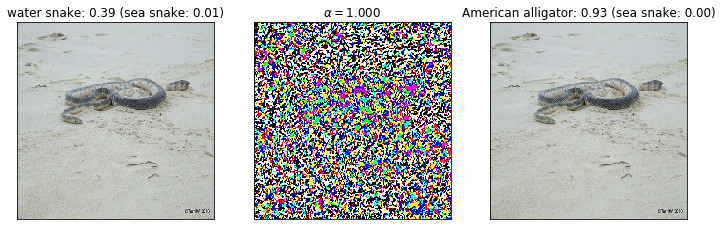

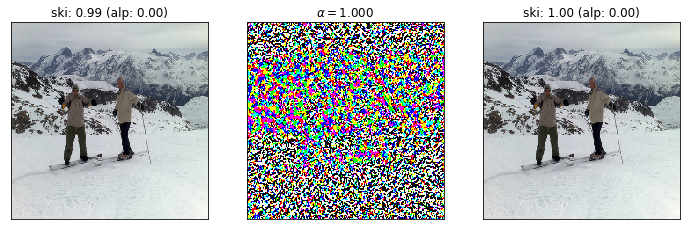

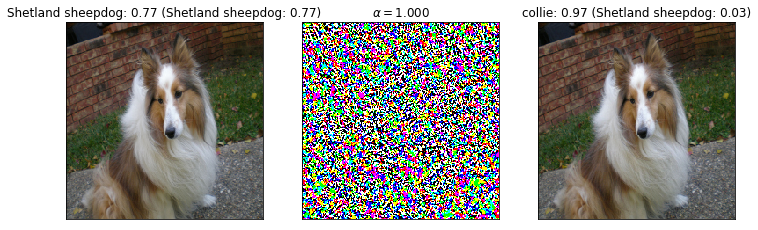

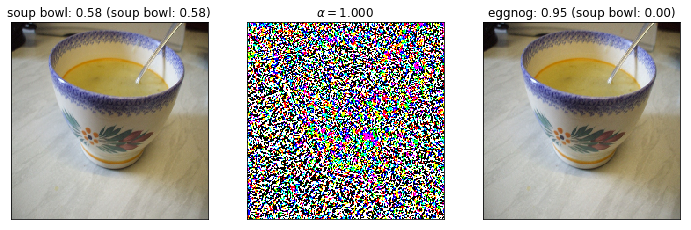

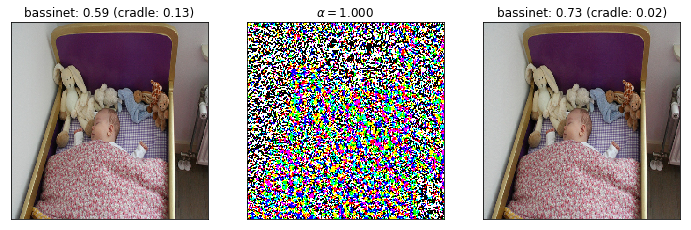

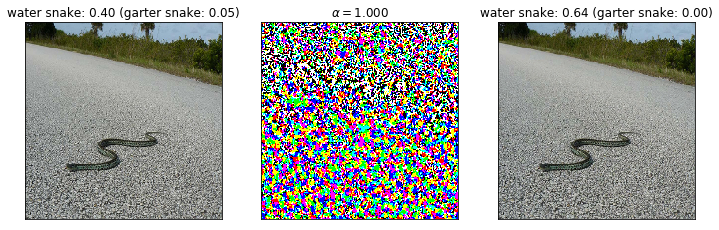

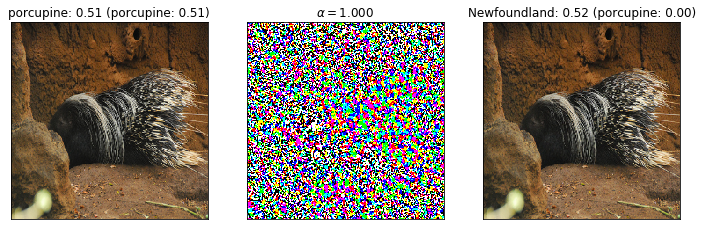

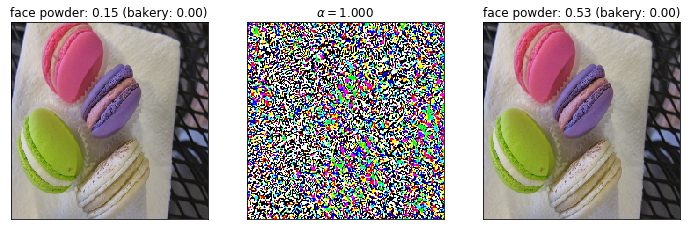

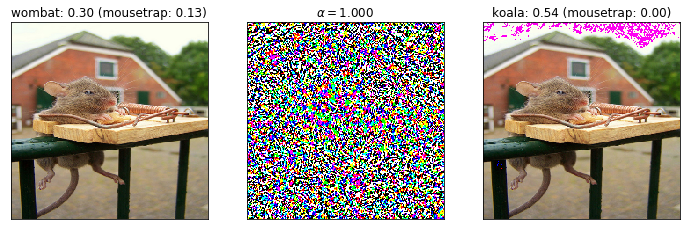

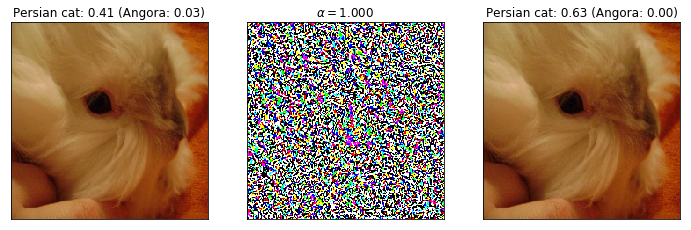

In [223]:
alpha = 1.0
show_fig = True
for i in range(10):
    compute_adversarial_example(net, transformer, paths[i], labels[i], method = 'fgsm', 
                                alpha = alpha, show_fig = show_fig)

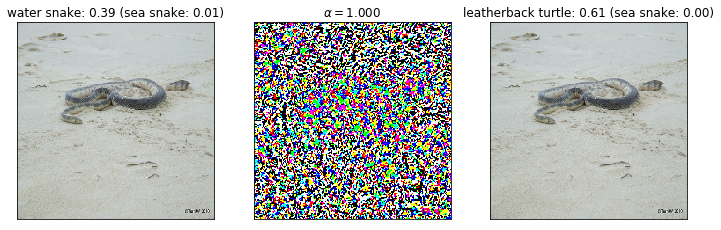

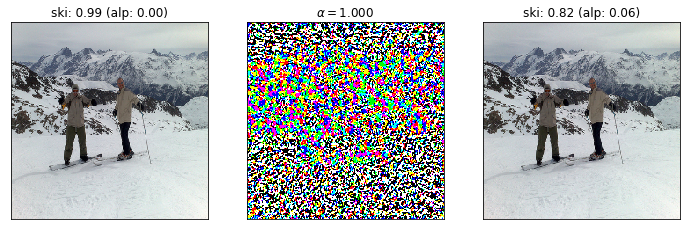

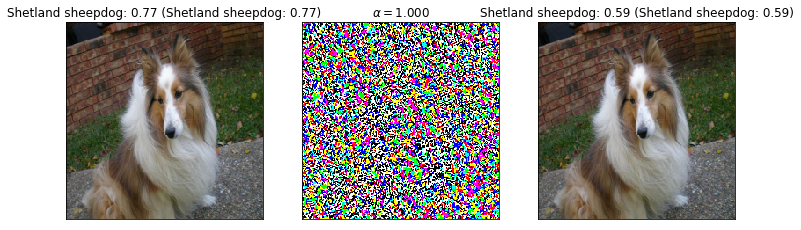

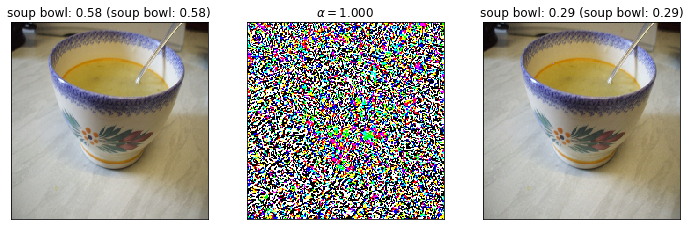

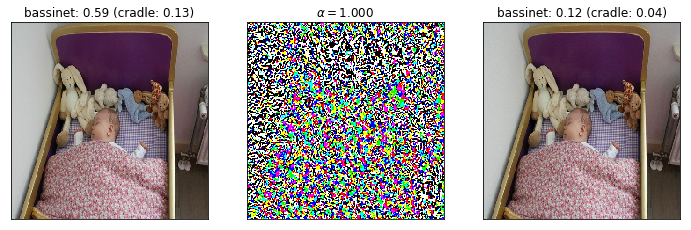

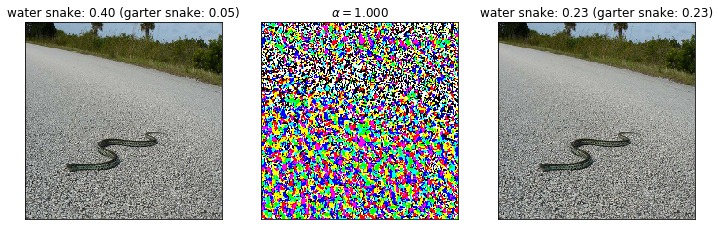

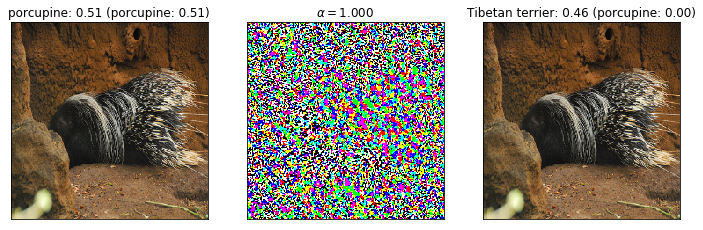

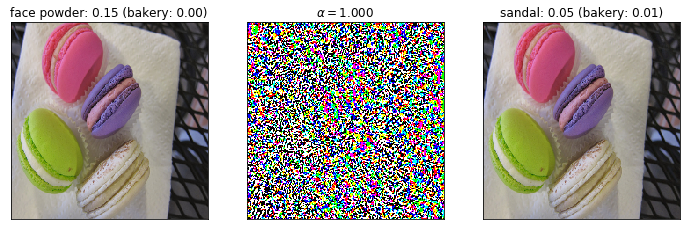

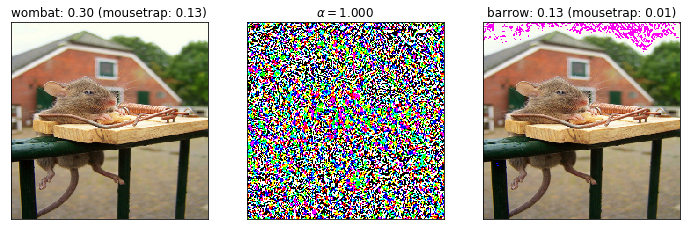

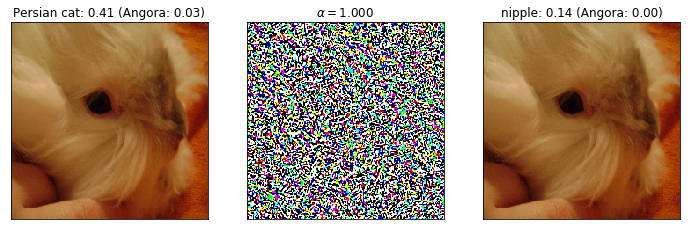

In [224]:
alpha = 1.0
show_fig = True
for i in range(10):
    compute_adversarial_example(net, transformer, paths[i], labels[i], method = 'one_step', alpha = alpha, show_fig = show_fig)

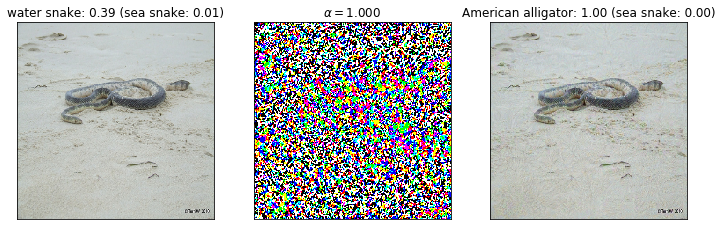

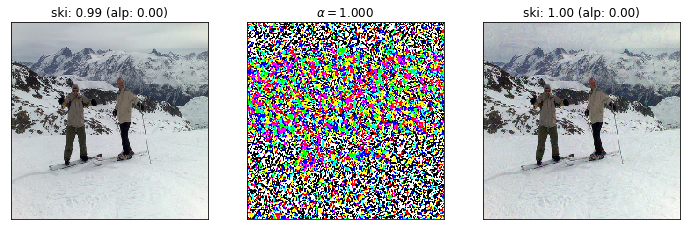

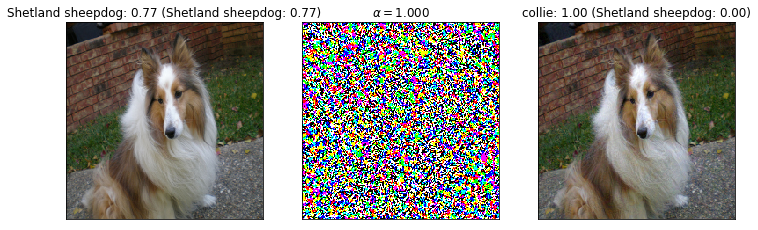

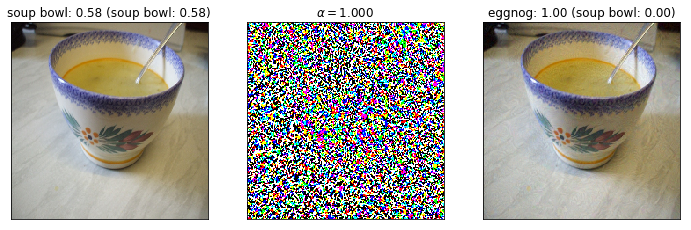

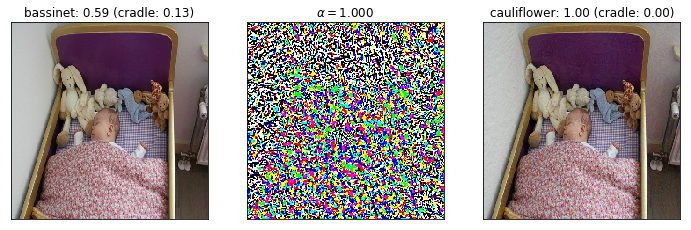

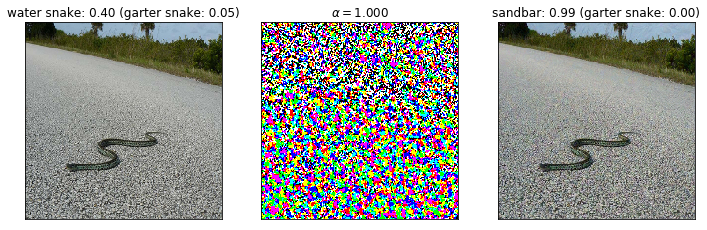

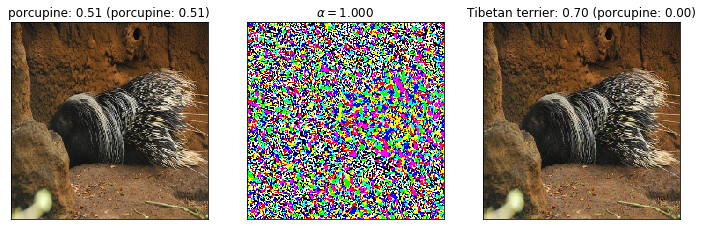

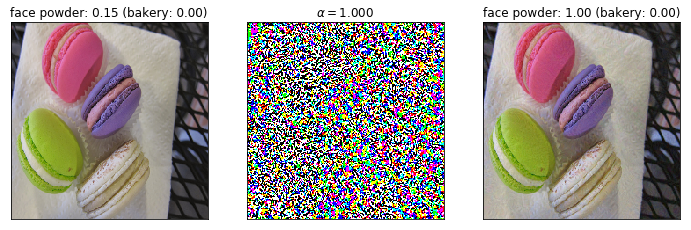

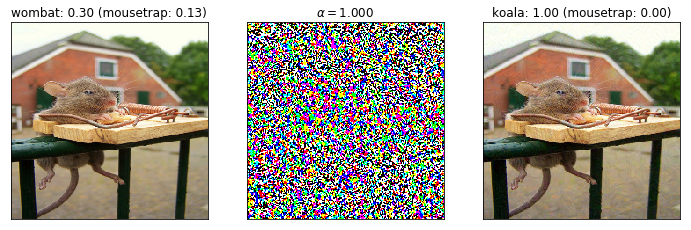

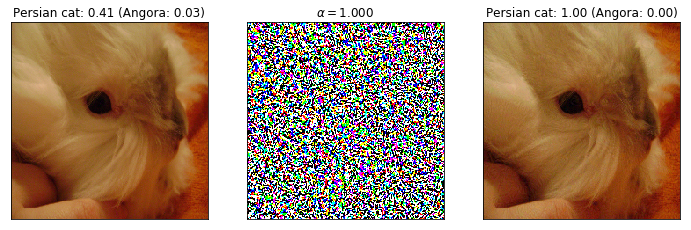

In [258]:
step = None
alpha = 1
eps = 8
show_fig = True
for i in range(10):
    compute_adversarial_example(net, transformer, paths[i], labels[i], method = 'fgsm',  
                                step = step, alpha = alpha, eps = eps, show_fig = show_fig)

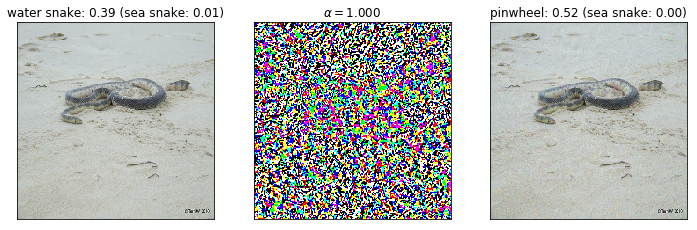

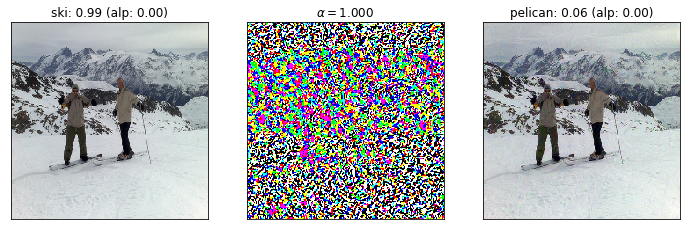

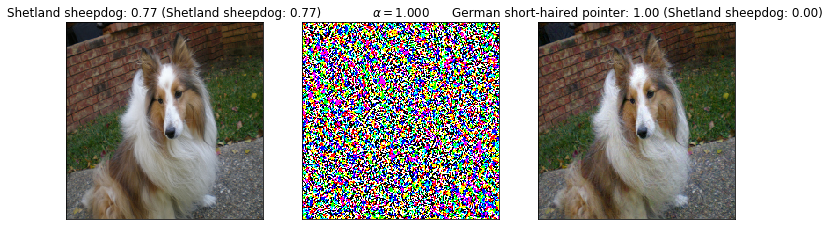

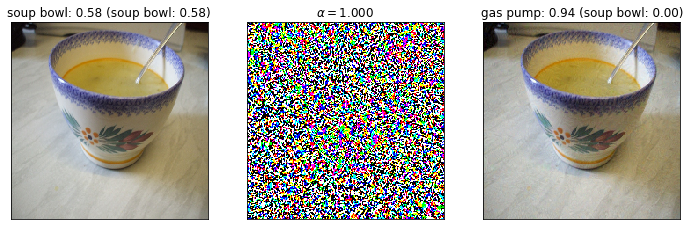

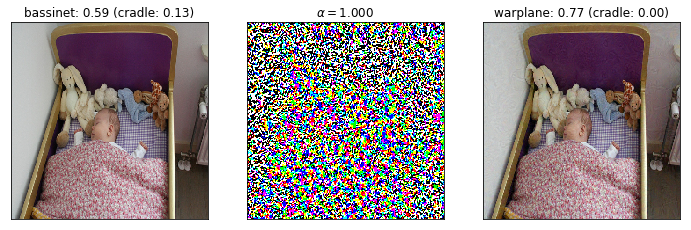

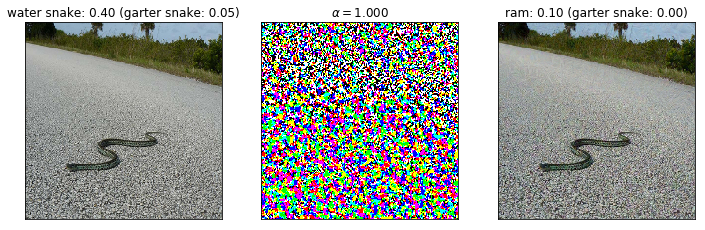

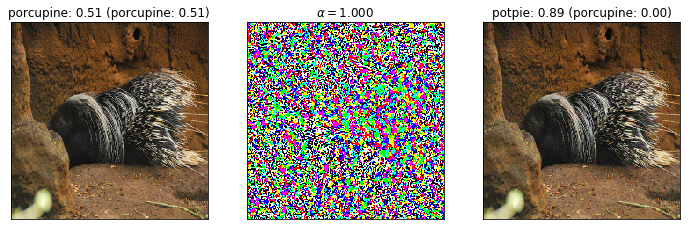

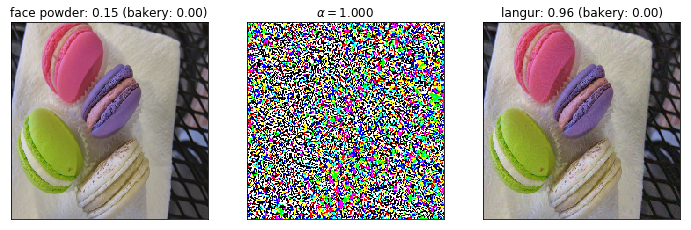

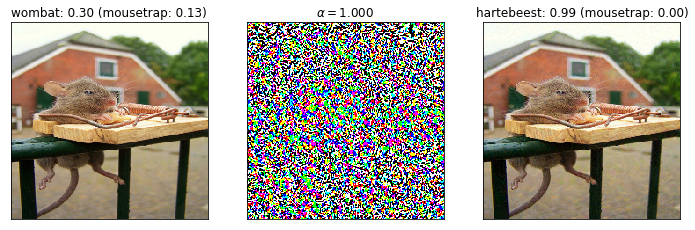

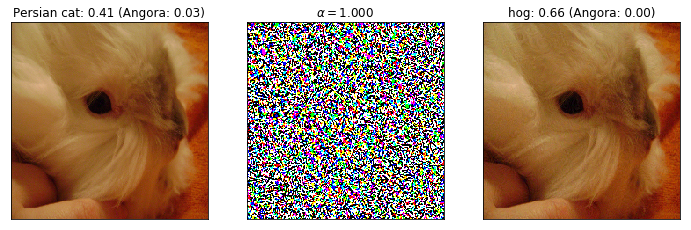

In [259]:
step = None
alpha = 1
eps = 8
show_fig = True
for i in range(10):
    compute_adversarial_example(net, transformer, paths[i], labels[i], method = 'one_step',  
                                step = step, alpha = alpha, eps = eps, show_fig = show_fig)

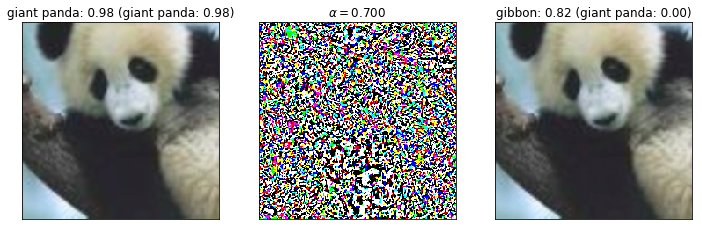

In [260]:
true_path = '../images/panda.png'
true_label = 388 # giant panda
alpha = 0.7
show_fig = True
adv_img = compute_adversarial_example(net, transformer, true_path, true_label, method = 'fgsm', alpha = alpha, show_fig = show_fig)

In [ ]:
imsave('adv_img.png', adv_img)
